In [57]:
# Loading all needed packages at the start
import elastix 
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import os
import SimpleITK as sitk



In [104]:
ELASTIX_PATH=r"C:\Users\20181758\Documents\master\Q3\8DM20\elastix-5.0.0-win64\elastix"
TRANSFORMIX_PATH=r"C:\Users\20181758\Documents\master\Q3\8DM20\elastix-5.0.0-win64\transformix"
# to Elastix.exe hiaha
#ELASTIX_PATH = r'C:/Users/20183303/Documents/Jaar 5 - ME/Q3/CS in medische beeldanalyse/Elastix files/Elastix.exe'
el = elastix.ElastixInterface(elastix_path=ELASTIX_PATH)
# to Transformix.exe
#TRANSFORMIX_PATH = r'C:/Users/20183303/Documents/Jaar 5 - ME/Q3/CS in medische beeldanalyse/Elastix files/Transformix.exe'
# to TrainingData
filepath_data = r'C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData'

In [59]:
parameter_file_path_experiment = os.path.join(filepath_data,'Affine.txt')


output_file_path_experiment = os.path.join(filepath_data,'results_affine')

fixed_image_path =r'C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\p115\mr_bffe.mhd'
moving_image_path = r'C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\p127\mr_bffe.mhd'

In [60]:

el.register(
    fixed_image=fixed_image_path,
    moving_image=moving_image_path,
    parameters=[parameter_file_path_experiment],
    output_dir=output_file_path_experiment)

C:\Users\20181758\Documents\master\Q3\8DM20\elastix-5.0.0-win64\elastix -f C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\p115\mr_bffe.mhd -m C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\p127\mr_bffe.mhd -p C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\Affine.txt -out C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\results_affine


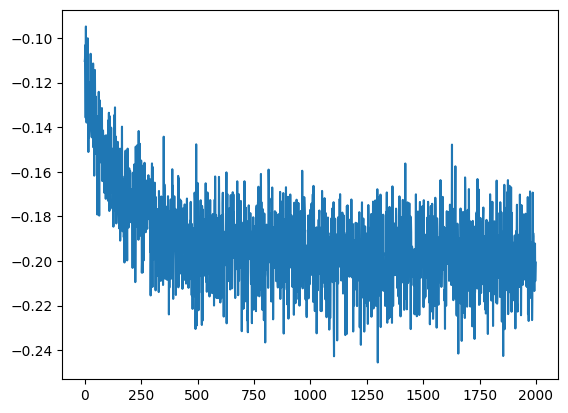

In [61]:
Iteration3_file_path=os.path.join(output_file_path_experiment,'IterationInfo.0.R0.txt')

logrand = elastix.logfile(Iteration3_file_path)
plt.plot(logrand['itnr'], logrand['metric'])

In [62]:
itk_image_fixed = sitk.ReadImage(fixed_image_path)
image_array_fixed = sitk.GetArrayFromImage(itk_image_fixed)
itk_image_moving = sitk.ReadImage(moving_image_path)
image_array_moving = sitk.GetArrayFromImage(itk_image_moving)

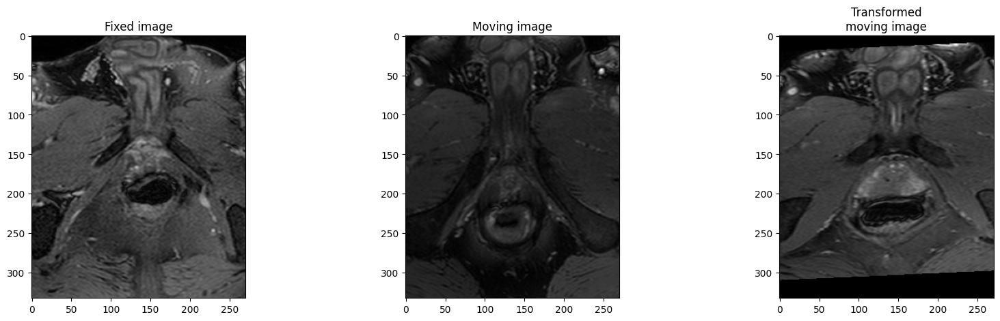

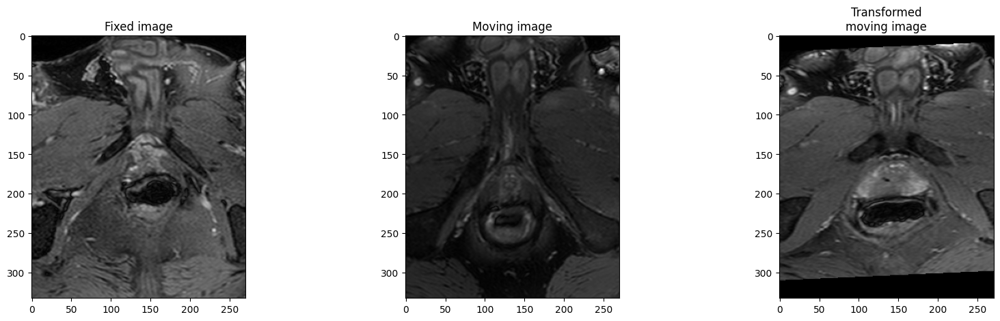

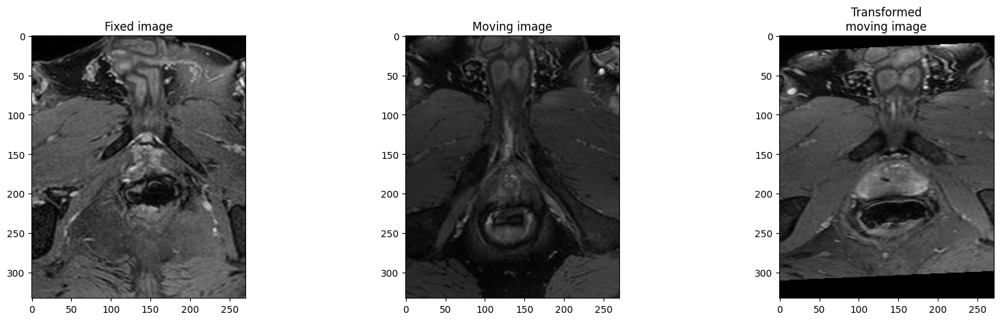

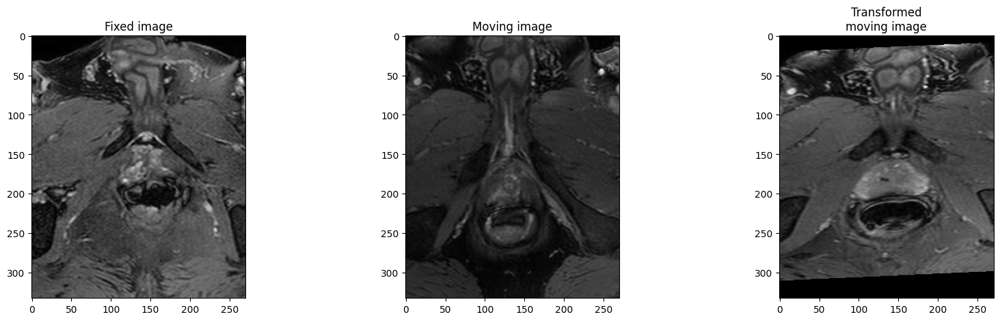

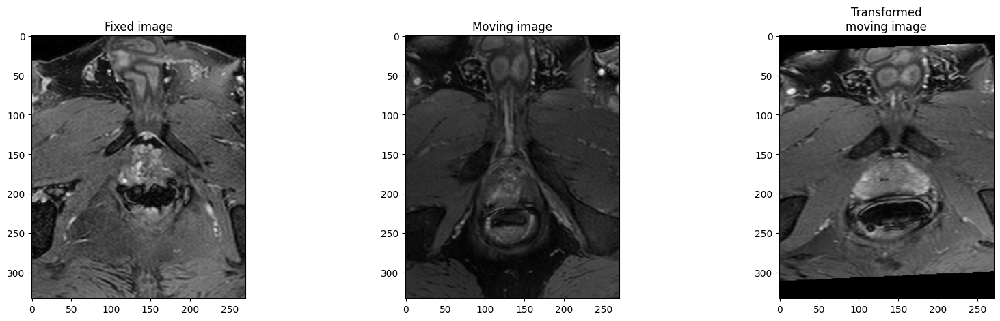

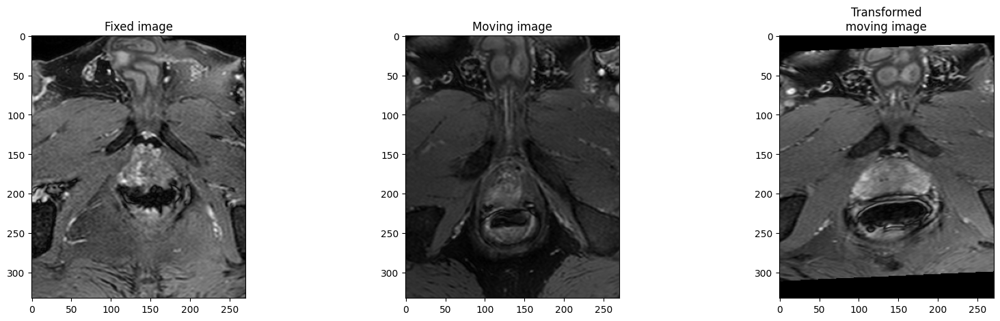

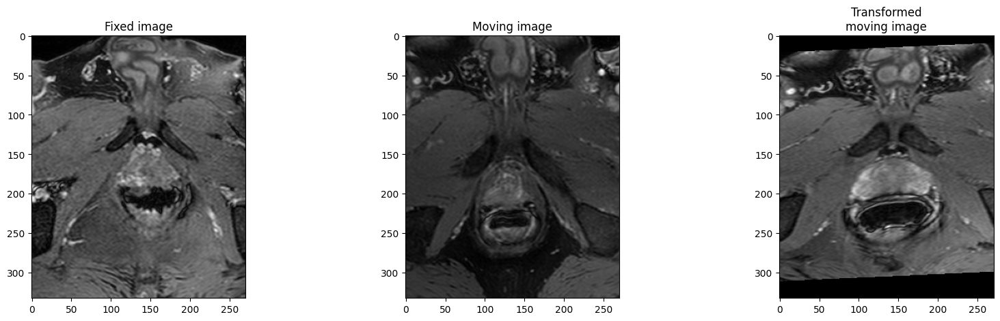

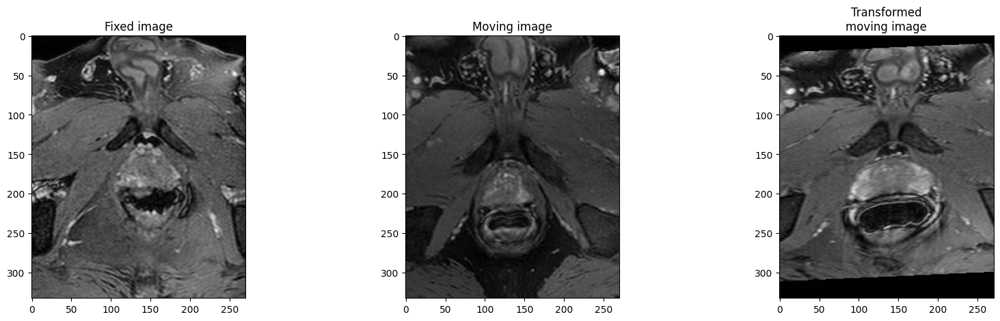

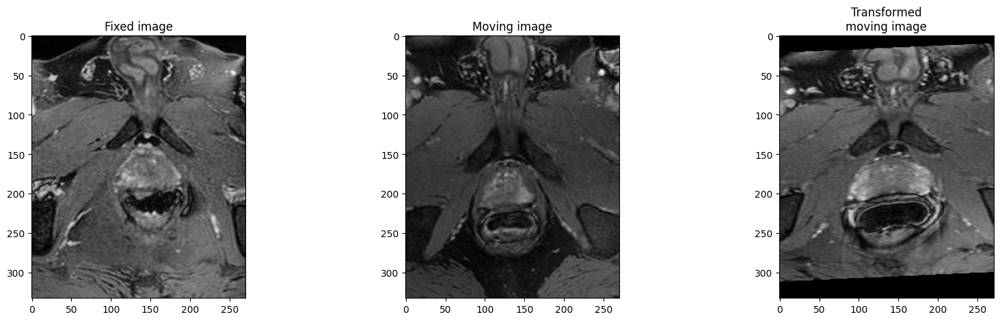

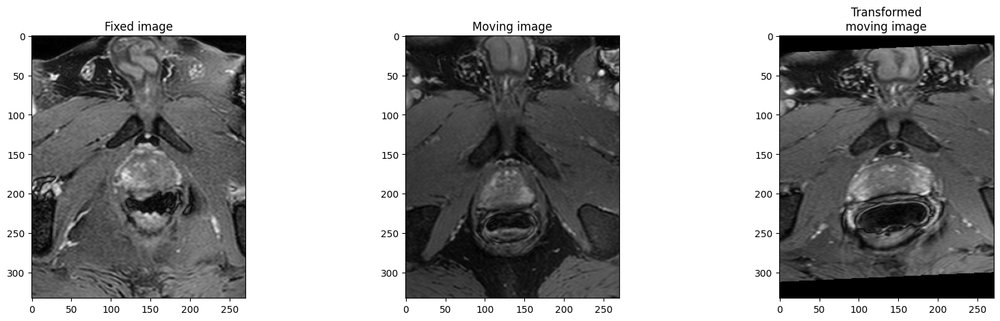

In [63]:
result_path_experiment = os.path.join(output_file_path_experiment, 'result.0.mhd')

transformed_moving_image = imageio.imread(result_path_experiment)

for i in range(20,30):
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    ax[0].imshow(image_array_fixed[i,:,:], cmap='gray')
    ax[0].set_title('Fixed image')
    ax[1].imshow(image_array_moving[i,:,:], cmap='gray')
    ax[1].set_title('Moving image')
    ax[2].imshow(transformed_moving_image[i,:,:], cmap='gray')
    ax[2].set_title('Transformed\nmoving image')

plt.show()

In [97]:
parameter_file_bsplines= r'C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\parametersjb4.txt'
#fixed_image_path =r'C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\p115\mr_bffe.mhd'
#itk_image_fixed = sitk.ReadImage(fixed_image_path)
#image_array_fixed = sitk.GetArrayFromImage(itk_image_fixed)

output_bfile_path_experiment=os.path.join(filepath_data,'result_b4')
el.register(
    fixed_image=fixed_image_path,
    moving_image=result_path_experiment,
    parameters=[parameter_file_bsplines],
    output_dir=output_bfile_path_experiment)

C:\Users\20181758\Documents\master\Q3\8DM20\elastix-5.0.0-win64\elastix -f C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\p115\mr_bffe.mhd -m C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\results_affine\result.0.mhd -p C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\parametersjb4.txt -out C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\result_b4


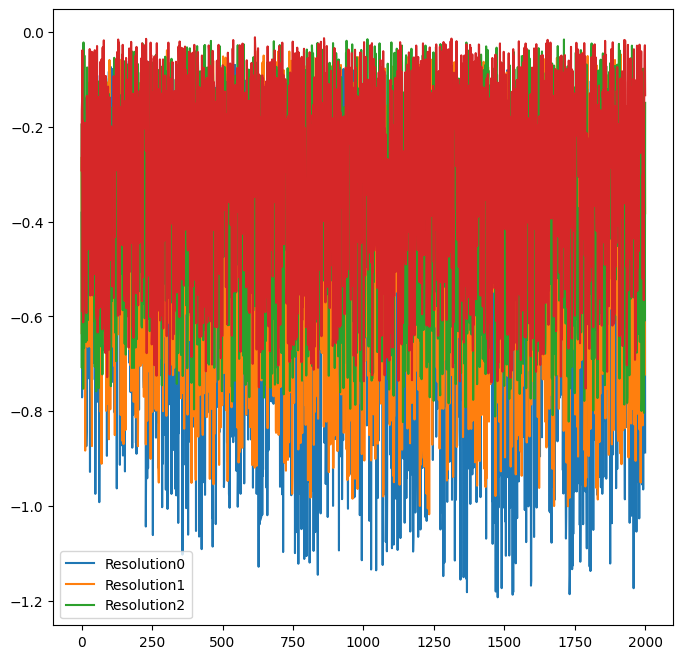

In [98]:
log0= elastix.logfile(r"C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\result_b4\IterationInfo.0.R0.txt")
log1= elastix.logfile(r"C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\result_b4\IterationInfo.0.R1.txt")
log2= elastix.logfile(r"C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\result_b4\IterationInfo.0.R2.txt")
log3= elastix.logfile(r"C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\result_b4\IterationInfo.0.R3.txt")


plt.figure(figsize=(8,8))

plt.plot(log0['itnr'], log0['metric'])
plt.plot(log1['itnr'], log1['metric'])
plt.plot(log2['itnr'], log2['metric'])
plt.plot(log3['itnr'], log3['metric'])

plt.legend(['Resolution' +str(i) for i in range(3)])

C:\Users\20181758\AppData\Local\Temp\ipykernel_34412\3709145027.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(20, 5))


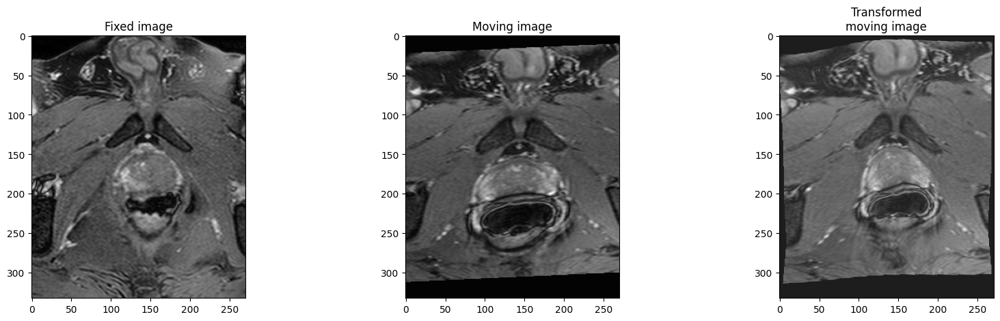

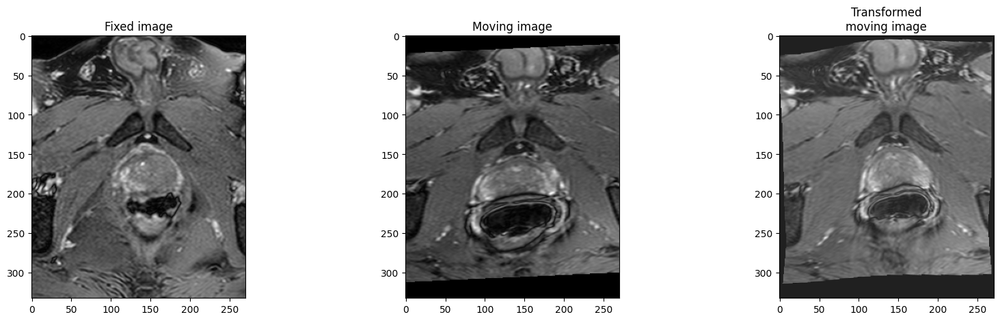

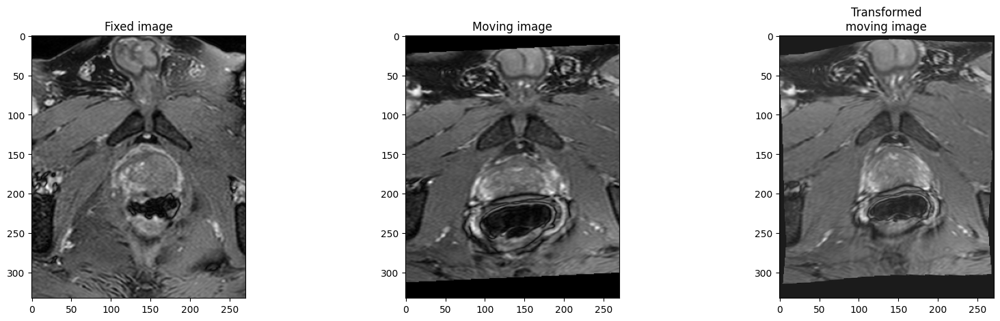

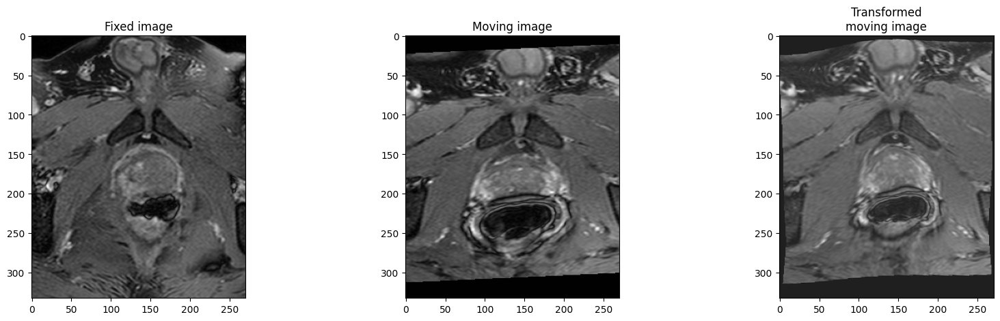

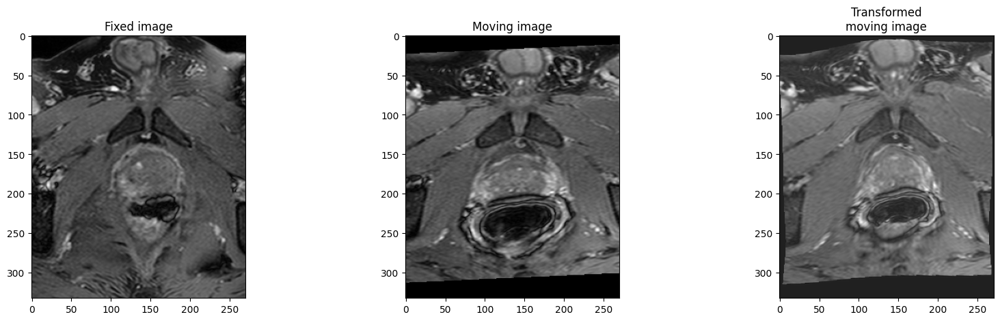

...

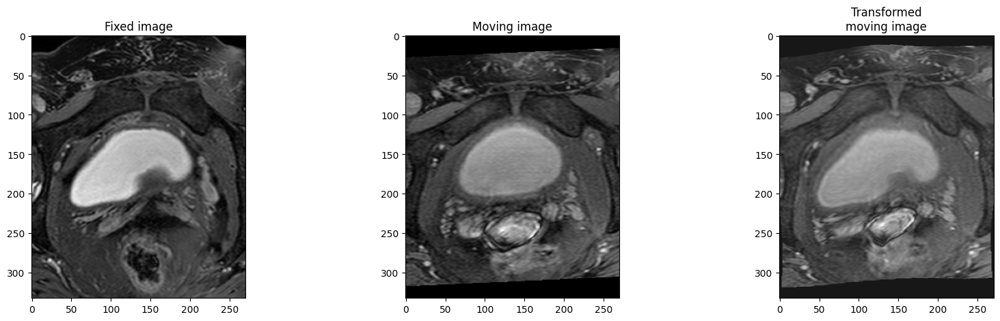

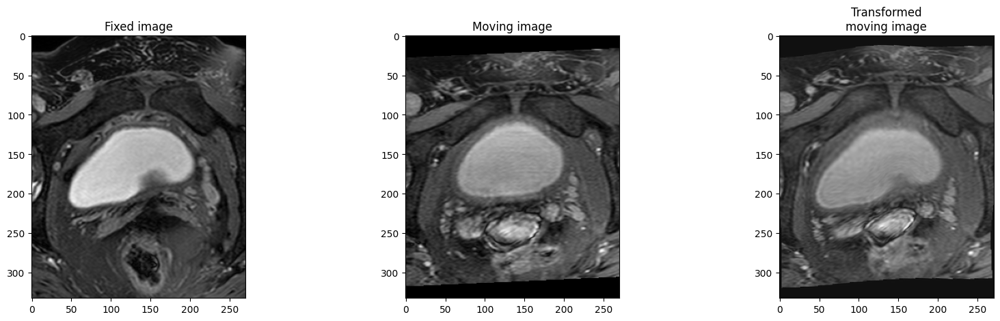

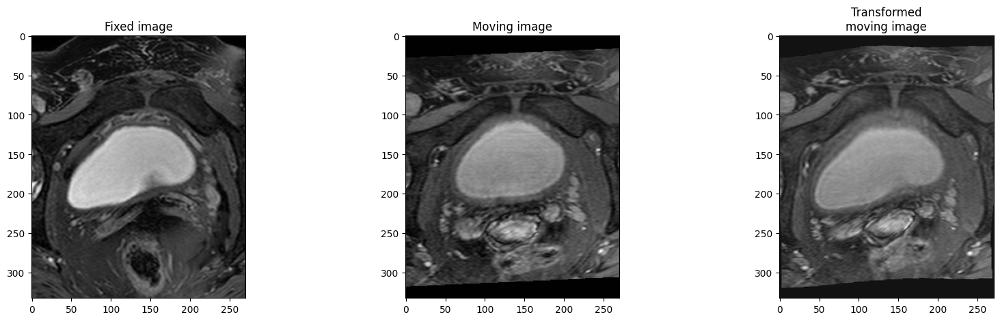

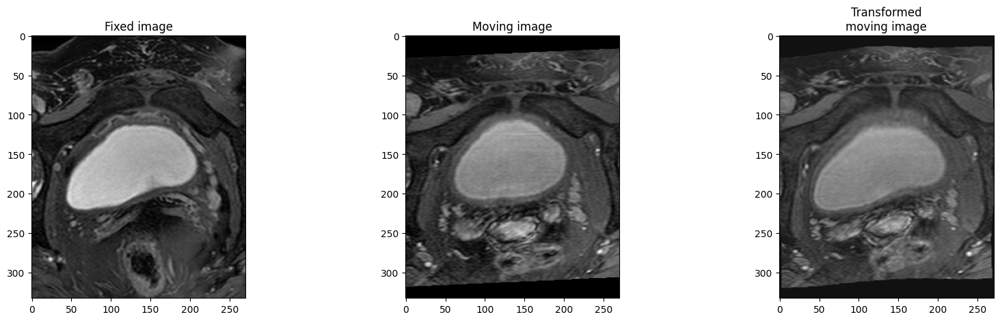

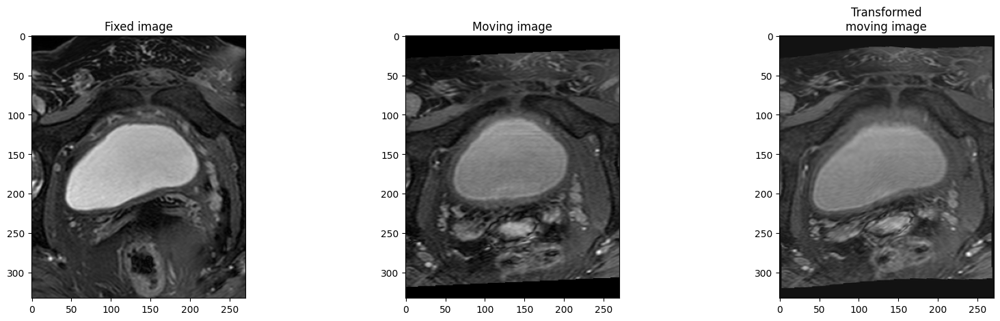

In [108]:
result_b_experiment = os.path.join(output_bfile_path_experiment, 'result.0.mhd')
affine_file_path_experiment = os.path.join(filepath_data,'results_store')
affin_file_path=os.path.join(output_file_path_experiment, 'result.0.mhd')


transformed_moving_image2 = imageio.imread(result_b_experiment)

moving_image=imageio.imread(affin_file_path)

for i in range(30,60):

    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    ax[0].imshow(image_array_fixed[i,:,:], cmap='gray')
    ax[0].set_title('Fixed image')
    ax[1].imshow(moving_image[i,:,:], cmap='gray')
    ax[1].set_title('Moving image')
    ax[2].imshow(transformed_moving_image2[i,:,:], cmap='gray')
    ax[2].set_title('Transformed\nmoving image')

plt.show()


In [106]:
parampath_mask=os.path.join(output_bfile_path_experiment,"TransformParameters.b4.txt")
tr = elastix.TransformixInterface(parameters=parampath_mask,
                                  transformix_path=TRANSFORMIX_PATH)


# Transform a new image with the transformation parameters
moving_image_path_mask = r'C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\p127\prostaat.mhd'
transformed_image_path_mask = tr.transform_image(moving_image_path_mask, output_dir=output_bfile_path_experiment)
print(parampath_mask )

C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\result_b4\TransformParameters.b4.txt


In [101]:
fixed_image_path_mask=r'C:\Users\20181758\Documents\master\Q3\capita\TrainingData\TrainingData\p115\prostaat.mhd'
result_path_experiment_b4 = transformed_image_path_mask
transformed_moving_image_b4 = imageio.imread(result_path_experiment_b4)
itk_image_fixed_mask = sitk.ReadImage(fixed_image_path_mask)
image_array_fixed_mask = sitk.GetArrayFromImage(itk_image_fixed_mask)
itk_image_moving_mask = sitk.ReadImage(moving_image_path_mask)
image_array_moving_mask = sitk.GetArrayFromImage(itk_image_moving_mask)

C:\Users\20181758\AppData\Local\Temp\ipykernel_34412\1760539.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(20, 5))


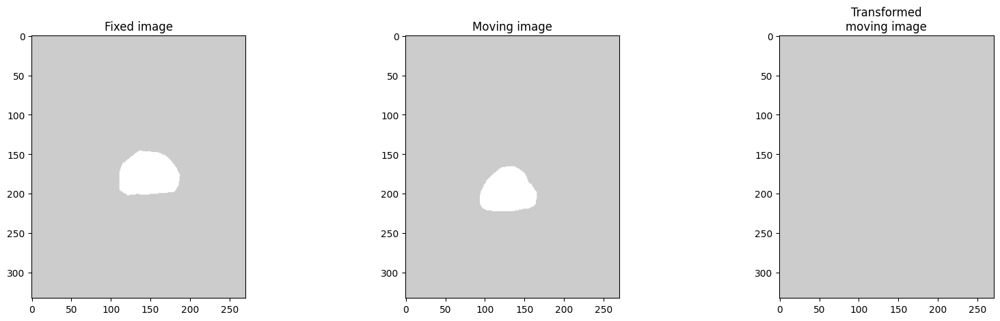

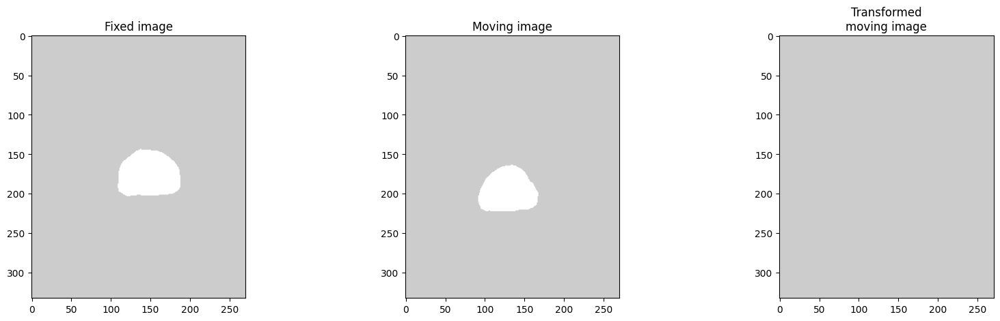

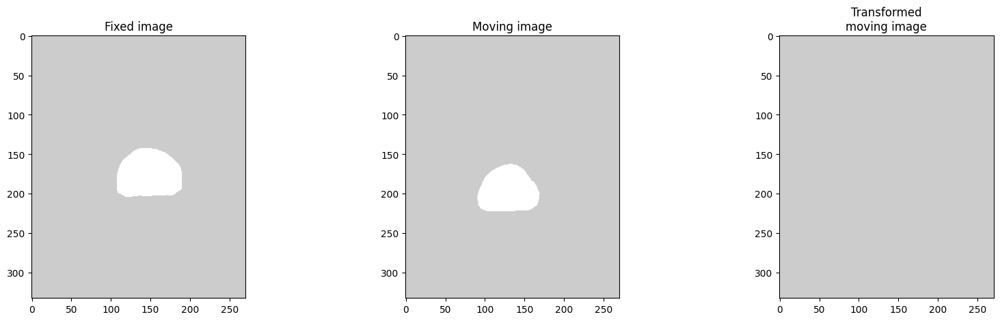

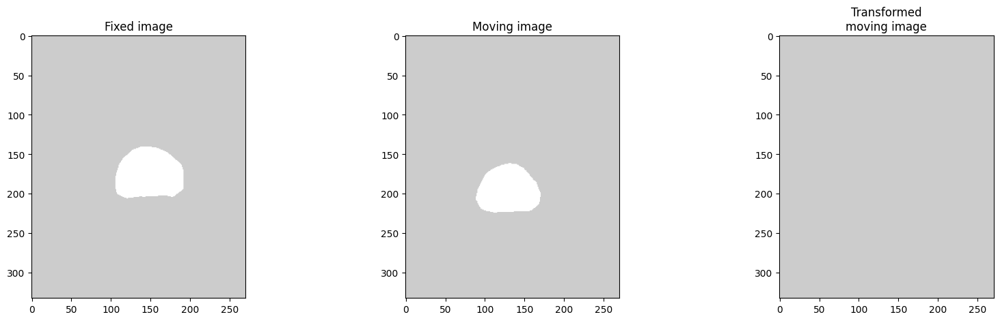

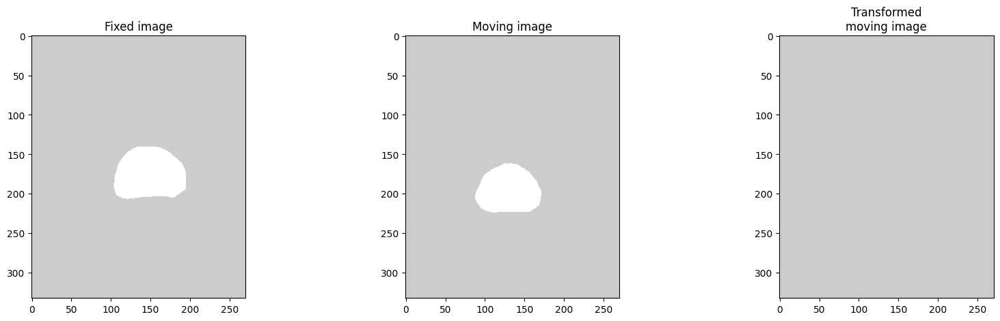

...

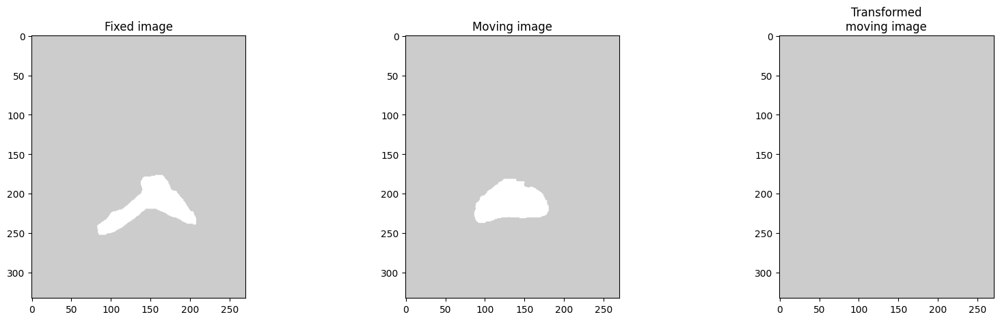

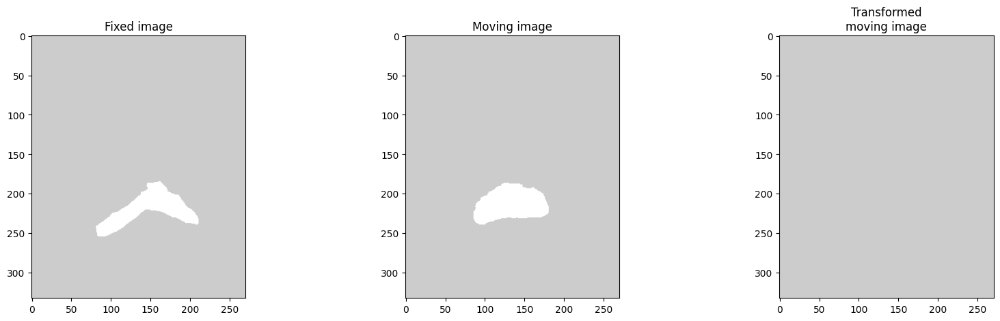

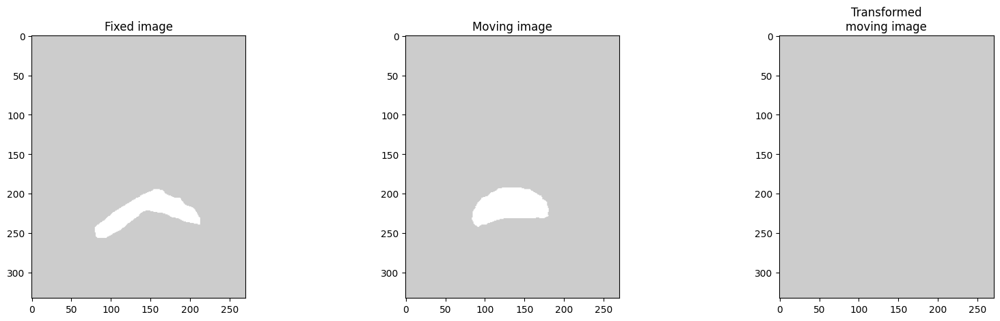

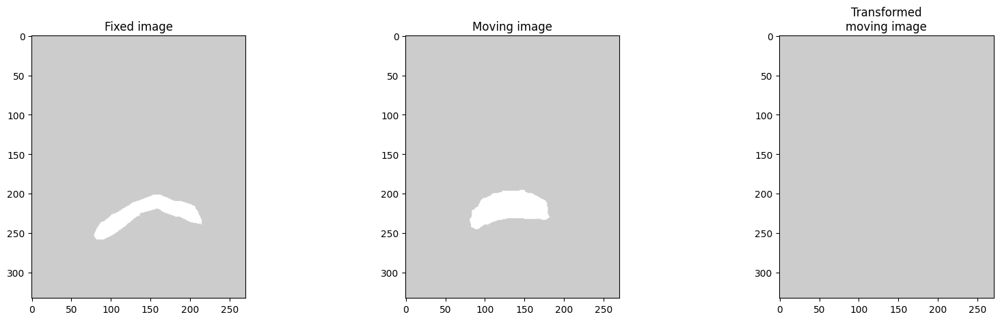

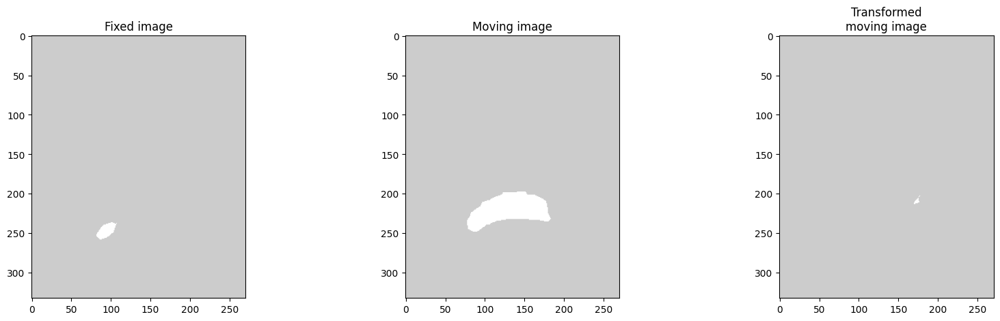

In [107]:
transformed_moving_image2 = imageio.imread(result_b_experiment)




for i in range(30,60):
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
   # ax[0].imshow(image_array_fixed[i,:,:],cmap='gray')
    ax[0].imshow(image_array_fixed_mask[i,:,:], cmap='gray', alpha=0.2)
    
    ax[0].set_title('Fixed image')
    #ax[1].imshow(image_array_moving[i,:,:],cmap='gray')
    ax[1].imshow(image_array_moving_mask[i,:,:], cmap='gray', alpha=0.2)

    ax[1].set_title('Moving image')
   # ax[2].imshow(transformed_moving_image2[i,:,:],cmap='gray')
    ax[2].imshow(transformed_moving_image_b4[i,:,:], cmap='gray',alpha=0.2)
 
    ax[2].set_title('Transformed\nmoving image')